Adversarial patch, phantom sponge

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


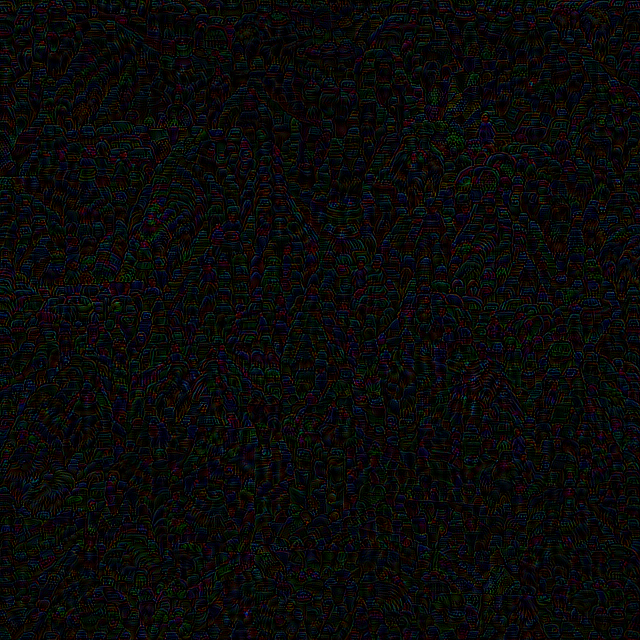

In [1]:
import numpy as np
from IPython.display import Image
from PIL import Image

img_path = 'BDD100K/images/val/b1c9c847-3bda4659.jpg'
perturb_path = 'uap_train/yolov_5_epsilon=70_lambda1=1_lambda2=10/upatech_epoch_64_btach125_s_model.png'
Image.open(perturb_path)

After resizing adversarial patch, phantom sponge

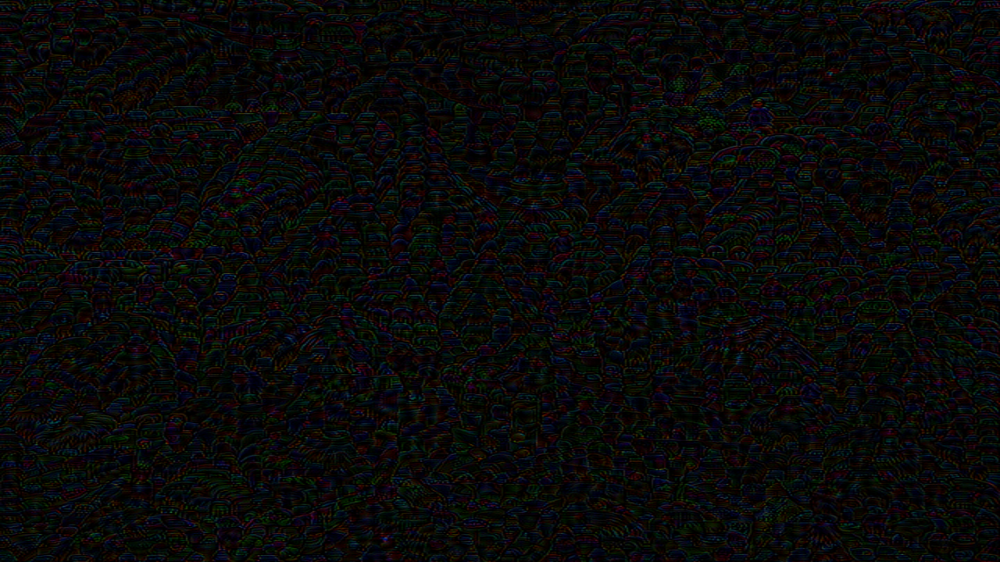

In [2]:
adv_patch = Image.open(perturb_path)
clean_img = Image.open(img_path)
adv_patch = adv_patch.resize((clean_img.size))
adv_patch

Before

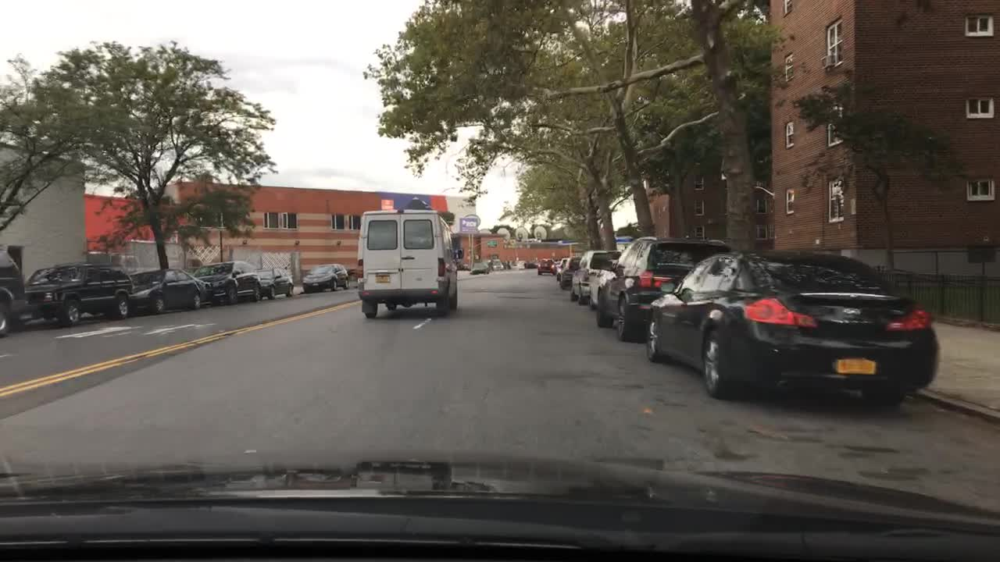

In [3]:
Image.open(img_path)

After(with bug! don't know what caused it!)

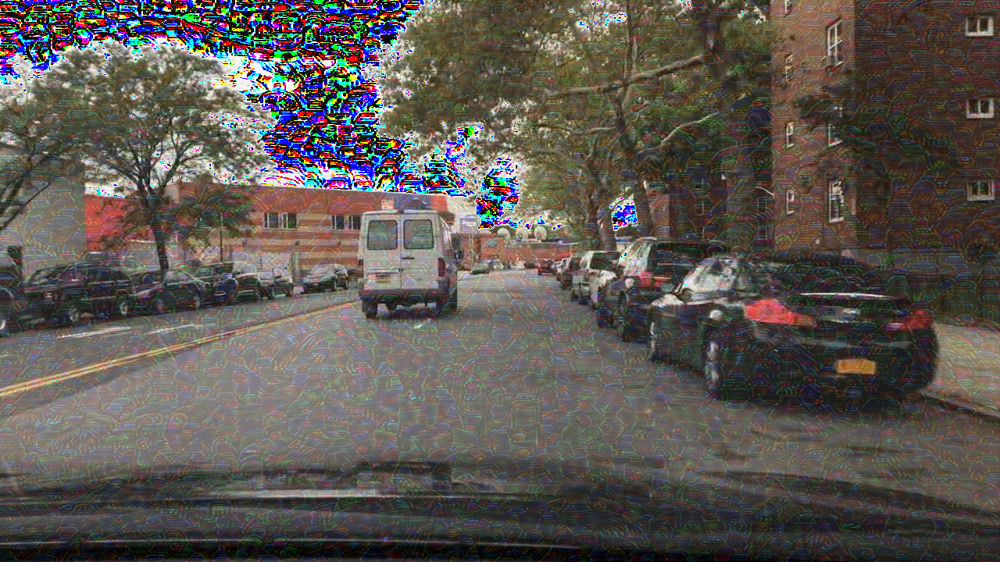

In [4]:
adv_img = np.clip(np.array(clean_img) + np.array(adv_patch), 0, 255)
img = Image.fromarray(adv_img, 'RGB')
img

In [5]:
import torch
import torchvision.transforms as transforms
def add_perturbation2image_tensor(img_tensor, perturbation_tensor):
    adv_img_tensor = torch.clamp(img_tensor + perturbation_tensor, 0, 1)
    return adv_img_tensor

def image2tensor(img_pil):
    img_tensor = transforms.ToTensor()(img_pil)
    return img_tensor

def image2array(img_path):
    img_tensor = image2tensor(img_path)
    img = transforms.ToPILImage()(img_tensor)
    return np.array(img)

def tensor2image(img_tensor):
    img_pil = transforms.ToPILImage()(img_tensor)
    return img_pil

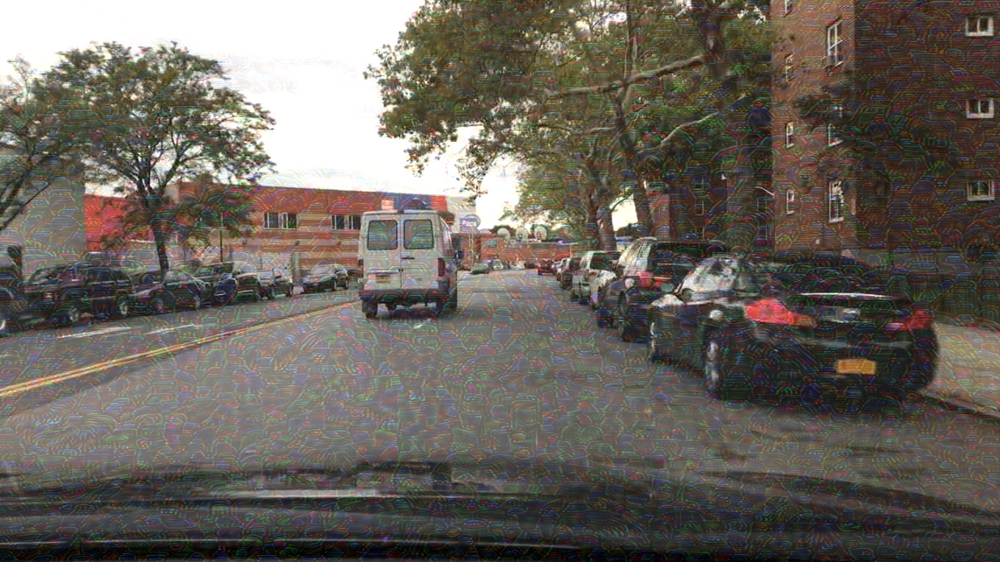

In [6]:
# load from tensor
adv_img_tensor = add_perturbation2image_tensor(image2tensor(clean_img), image2tensor(adv_patch))
adv_img_pil = tensor2image(adv_img_tensor)
display(adv_img_pil)